# Task2 – Beat tracking (Python - notebook *.ipynb)

#### Use librosa.beat.beat_track to estimate the beat locations and the global tempo:

In [12]:
%matplotlib inline
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display
import matplotlib.pyplot as plt

In [2]:
x, sr = librosa.load('tap_example1.wav')
ipd.Audio(x, rate=sr)

In [3]:
x2, sr2 = librosa.load('tap_example2.wav')
ipd.Audio(x2, rate=sr2)

In [7]:
x3, sr3 = librosa.load('tapexample_3.wav')
ipd.Audio(x3, rate=sr3)

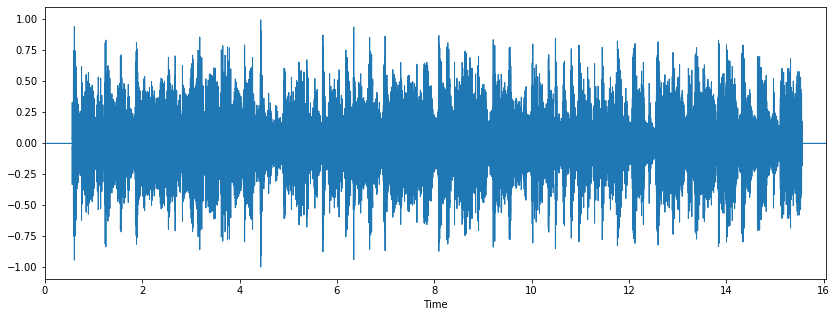

In [8]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr)

In [68]:
def beats(x, sr):
    # Track beats using a pre-computed onset envelope
    onset_env = librosa.onset.onset_strength(x, sr=sr, aggregate=numpy.median)
    '''
            1. Measure onset strength
            2. Estimate tempo from onset correlation
            3. Pick peaks in onset strength approximately consistent with estimated tempo
    '''
    tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env,sr=sr)
    hop_length = 512
    plt.figure(figsize=(8, 4))
    times = librosa.times_like(onset_env, sr=sr, hop_length=hop_length)
    plt.plot(times, librosa.util.normalize(onset_env),label='Onset strength')
    plt.vlines(times[beats], 0, 1, alpha=0.5, color='r', linestyle='--', label='Beats')
    #print(times[beats])
    plt.legend(frameon=True, framealpha=0.75)
    # Limit the plot to a 15-second window
    plt.xlim(0, 15)
    plt.gca().xaxis.set_major_formatter(librosa.display.TimeFormatter())
    plt.tight_layout()
    plt.show()
    
    # clicks at beat times
    times = librosa.frames_to_time(beats, sr=sr)
    y_beat_times = librosa.clicks(times=times, sr=sr,length=len(x))
    #clicks = librosa.clicks(frames=beats, sr=sr, length=len(x))
    return y_beat_times
    

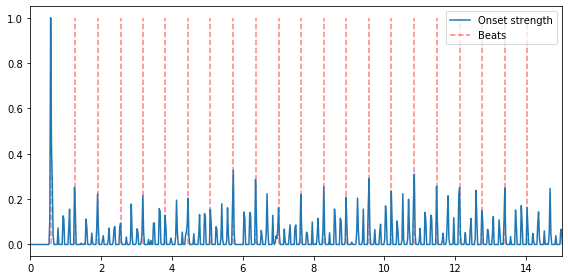

In [69]:
clicks = beats(x, sr)
#print(clicks)
ipd.Audio(x + clicks, rate=sr)

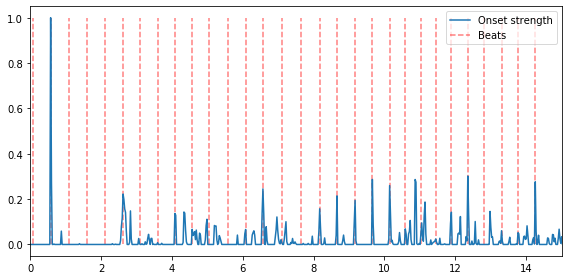

In [70]:
clicks = beats(x2, sr2)
#print(clicks)
ipd.Audio(x2 + clicks, rate=sr2)

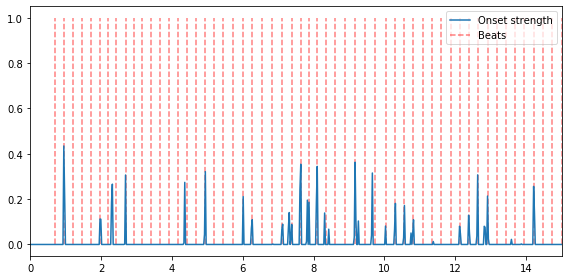

In [71]:
clicks = beats(x3, sr3)
#print(clicks)
ipd.Audio(x3 + clicks, rate=sr3)

### Comment the results, by making a subjective evaluation of the 3 outputs of the beat tracking (one paragraph).
By listening the audio, we managed to find the taps/beats that are almost the same as clicks in created plots of examples showing the beats. As we can see from the plotted results - the first audio is the slowest (because it has the smallest number of beats in same amount of time (15 seconds), on the other hand the third sound is the fastest (the most beasts, highest tempo).